In [1]:
!pip install kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
# !kaggle datasets download -d NIH Chest X-rays
!kaggle datasets download -d nih-chest-xrays/data
# !kaggle datasets download -d nih-chest-xrays/sample

Dataset URL: https://www.kaggle.com/datasets/nih-chest-xrays/data
License(s): CC0-1.0
100% 42.0G/42.0G [09:25<00:00, 104MB/s]
100% 42.0G/42.0G [09:25<00:00, 79.7MB/s]


In [6]:
!unzip data.zip

Streaming output truncated to the last 5000 lines.
  inflating: images_012/images/00028897_016.png  
  inflating: images_012/images/00028897_017.png  
  inflating: images_012/images/00028897_018.png  
  inflating: images_012/images/00028897_019.png  
  inflating: images_012/images/00028897_020.png  
  inflating: images_012/images/00028898_000.png  
  inflating: images_012/images/00028899_000.png  
  inflating: images_012/images/00028899_001.png  
  inflating: images_012/images/00028899_002.png  
  inflating: images_012/images/00028900_000.png  
  inflating: images_012/images/00028901_000.png  
  inflating: images_012/images/00028901_001.png  
  inflating: images_012/images/00028902_000.png  
  inflating: images_012/images/00028902_001.png  
  inflating: images_012/images/00028902_002.png  
  inflating: images_012/images/00028902_003.png  
  inflating: images_012/images/00028902_004.png  
  inflating: images_012/images/00028902_005.png  
  inflating: images_012/images/00028902_006.png  

In [ ]:
import os
import cv2

def resize_images_in_folder(folder_path, target_size=(224, 224)):
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
                file_path = os.path.join(root, file)
                image = cv2.imread(file_path)
                if np.shape(image)[1]!=224:
                    if image is not None:
                        resized_image = cv2.resize(image, target_size)
                        cv2.imwrite(file_path, resized_image)
                    else:
                        print(f"Failed to read image {file_path}")

def process_all_image_folders(base_dir):
    for root, dirs, files in os.walk(base_dir):
        for dir_name in dirs:
            if dir_name.startswith('images_'):
                images_folder_path = os.path.join(root, dir_name, 'images')
                if os.path.exists(images_folder_path):
                    print(f"Resizing images in {images_folder_path}")
                    resize_images_in_folder(images_folder_path)
                else:
                    print(f"No 'images' folder found in {os.path.join(root, dir_name)}")

if __name__ == "__main__":
    base_directory = '/content/'
    process_all_image_folders(base_directory)

In [3]:
!rm -rf /content/sample_data
!rm -rf /datalab
!rm -rf /boot
!rm -rf /lib32

In [7]:
!rm /content/data.zip

In [10]:
import pandas as pd

data = pd.read_csv("/content/Data_Entry_2017.csv")
data

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11
0,00000001_000.png,Cardiomegaly,0,1,58,M,PA,2682,2749,0.143,0.143,NaN
1,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,PA,2894,2729,0.143,0.143,NaN
2,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,PA,2500,2048,0.168,0.168,NaN
3,00000002_000.png,No Finding,0,2,81,M,PA,2500,2048,0.171,0.171,NaN
4,00000003_000.png,Hernia,0,3,81,F,PA,2582,2991,0.143,0.143,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
112115,00030801_001.png,Mass|Pneumonia,1,30801,39,M,PA,2048,2500,0.168,0.168,NaN
112116,00030802_000.png,No Finding,0,30802,29,M,PA,2048,2500,0.168,0.168,NaN
112117,00030803_000.png,No Finding,0,30803,42,F,PA,2048,2500,0.168,0.168,NaN
112118,00030804_000.png,No Finding,0,30804,30,F,PA,2048,2500,0.168,0.168,NaN


In [11]:
import glob
import os

imgs = [os.path.basename(i) for i in glob.glob("/content/images_*/images/*")]
print(len(imgs))
print(imgs)

112120
['00023026_004.png', '00022141_024.png', '00022763_001.png', '00023176_007.png', '00023333_000.png', '00022532_001.png', '00022151_001.png', '00021942_010.png', '00023116_010.png', '00022484_002.png', '00023190_012.png', '00022705_000.png', '00022837_049.png', '00023128_007.png', '00022526_015.png', '00021616_008.png', '00024171_000.png', '00023019_002.png', '00023192_000.png', '00021810_001.png', '00021130_002.png', '00021201_017.png', '00023282_000.png', '00021188_010.png', '00021635_002.png', '00022672_006.png', '00022415_005.png', '00022807_000.png', '00023604_002.png', '00024015_000.png', '00022588_002.png', '00022837_038.png', '00022845_000.png', '00021201_047.png', '00020975_000.png', '00021841_000.png', '00022260_007.png', '00021926_003.png', '00023068_045.png', '00020959_002.png', '00023684_000.png', '00022237_028.png', '00023080_001.png', '00021431_010.png', '00023068_039.png', '00022815_020.png', '00022765_000.png', '00022260_000.png', '00021409_004.png', '00024488_00

In [ ]:
# from tqdm import tqdm
# inds = []
# for j in tqdm(range(len(imgs))):
#     inds.append(data.index[data['Image Index'] == imgs[j]].tolist()[0])
# print(inds)

100%|██████████| 5606/5606 [00:05<00:00, 1106.84it/s]

[4093, 2276, 3277, 2047, 1388, 2065, 3669, 3292, 5092, 5191, 1146, 3572, 4749, 5077, 3493, 1047, 874, 3701, 1363, 2912, 3958, 2035, 737, 650, 5118, 773, 1624, 3210, 2537, 4649, 2172, 3718, 4351, 2038, 3897, 4948, 1510, 3101, 945, 2205, 3707, 1369, 780, 933, 430, 4809, 4980, 2961, 556, 4278, 3008, 2806, 4811, 4869, 1014, 4658, 188, 3224, 333, 4986, 5602, 1170, 3135, 5541, 4531, 4448, 5526, 5592, 4449, 4320, 5424, 227, 3221, 4917, 1615, 5093, 3996, 4062, 4490, 2573, 1714, 3487, 5466, 4410, 3802, 3170, 5594, 2911, 823, 3349, 576, 3409, 4485, 4419, 5446, 4746, 4277, 2518, 44, 5396, 2064, 51, 4220, 5250, 3895, 2560, 976, 1839, 458, 2362, 3478, 436, 301, 1204, 622, 3500, 5255, 4231, 4858, 2508, 1025, 2773, 1177, 3495, 265, 5291, 3923, 43, 3518, 4108, 4358, 460, 5001, 3139, 3678, 2566, 3276, 3005, 1851, 1321, 641, 4848, 4005, 5030, 1999, 4239, 3513, 5345, 974, 4549, 2085, 4607, 1858, 5545, 1930, 2783, 3710, 1301, 4374, 3317, 3675, 4458, 4510, 2321, 1376, 4820, 684, 3384, 4234, 5087, 3912, 763

In [ ]:
# df = data.loc[inds]
# df.reset_index(drop=True, inplace=True)
# df

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,OriginalImagePixelSpacing_y
0,00020190_002.png,Atelectasis,2,20190,057Y,M,PA,2992,2991,0.143,0.143
1,00011678_000.png,Atelectasis,0,11678,055Y,M,PA,2992,2991,0.143,0.143
2,00016177_009.png,No Finding,9,16177,054Y,M,PA,2992,2991,0.143,0.143
3,00010613_009.png,No Finding,9,10613,056Y,M,PA,2992,2991,0.143,0.143
4,00007193_012.png,Infiltration,12,7193,048Y,F,AP,2500,2048,0.168,0.168
...,...,...,...,...,...,...,...,...,...,...,...
5601,00007328_012.png,No Finding,12,7328,041Y,M,AP,2500,2048,0.171,0.171
5602,00004808_022.png,No Finding,22,4808,035Y,M,AP,2500,2048,0.168,0.168
5603,00017645_007.png,Nodule,7,17645,048Y,F,PA,2992,2991,0.143,0.143
5604,00016778_003.png,Atelectasis|Infiltration|Pleural_Thickening,3,16778,025Y,M,AP,3056,2544,0.139,0.139


In [13]:
[i for i in data['Finding Labels'].unique() if "Cardiomegaly" in i or "No Finding" in i]

['Cardiomegaly',
 'Cardiomegaly|Emphysema',
 'Cardiomegaly|Effusion',
 'No Finding',
 'Cardiomegaly|Infiltration|Mass|Nodule',
 'Cardiomegaly|Effusion|Emphysema|Mass',
 'Atelectasis|Cardiomegaly|Emphysema|Mass|Pneumothorax',
 'Cardiomegaly|Emphysema|Pneumothorax',
 'Cardiomegaly|Mass|Pleural_Thickening',
 'Cardiomegaly|Edema|Effusion',
 'Cardiomegaly|Consolidation',
 'Cardiomegaly|Infiltration',
 'Cardiomegaly|Edema|Effusion|Infiltration',
 'Cardiomegaly|Edema|Infiltration',
 'Cardiomegaly|Edema',
 'Atelectasis|Cardiomegaly|Fibrosis',
 'Atelectasis|Cardiomegaly|Consolidation|Effusion',
 'Atelectasis|Cardiomegaly|Effusion',
 'Cardiomegaly|Effusion|Pleural_Thickening',
 'Cardiomegaly|Nodule',
 'Cardiomegaly|Edema|Effusion|Fibrosis|Infiltration',
 'Cardiomegaly|Consolidation|Edema|Effusion',
 'Atelectasis|Cardiomegaly|Effusion|Infiltration',
 'Cardiomegaly|Edema|Effusion|Infiltration|Pneumonia',
 'Cardiomegaly|Effusion|Pneumonia',
 'Atelectasis|Cardiomegaly|Infiltration|Pneumothorax',
 'C

In [ ]:
# !rm -rf dataset

In [14]:
!mkdir dataset
!mkdir dataset/Cardiomegaly
!mkdir dataset/nonCardiomegaly

In [17]:
import glob
import os
from tqdm import tqdm
import cv2
import shutil

already1 = glob.glob("/content/dataset/Cardiomegaly/*")
already2 = glob.glob("/content/dataset/nonCardiomegaly/*")
for j,i in enumerate(tqdm(glob.glob("/content/images_*/images/*"))):
    try:
        if f"/content/dataset/nonCardiomegaly/{j}.png" not in already1 and f"/content/dataset/nonCardiomegaly/{j}.png" not in already2:
            img = cv2.imread(i)
            img = cv2.resize(img, (224,224))
            ind = data.index[data['Image Index'] == os.path.basename(i)].tolist()[0]
            if "Cardiomegaly" in data.iloc[ind]['Finding Labels']:
                # cv2.imwrite(f"/content/dataset/Cardiomegaly/{j}.png", img)
                shutil.copy2(i,f"/content/dataset/Cardiomegaly/{j}.png")
            elif "No Finding" in data.iloc[ind]['Finding Labels']:
                # cv2.imwrite(f"/content/dataset/nonCardiomegaly/{j}.png", img)
                shutil.copy2(i,f"/content/dataset/nonCardiomegaly/{j}.png")
    except Exception as e:
        continue

    # break

100%|██████████| 112120/112120 [50:39<00:00, 36.89it/s]


In [18]:
!du -sh dataset/

22G	dataset/


class imbalance

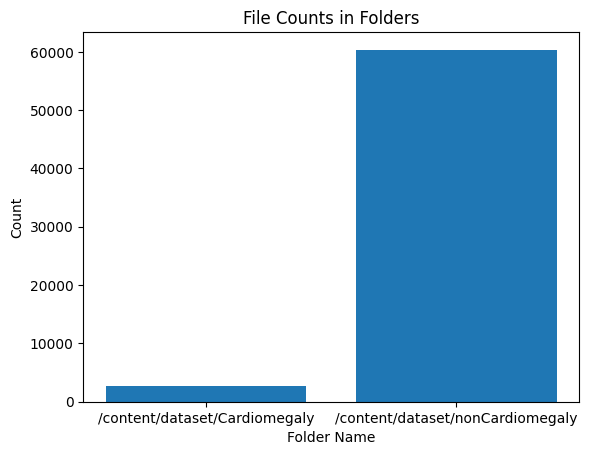

In [19]:
import os
import matplotlib.pyplot as plt

# Replace 'folder1' and 'folder2' with your actual folder names
folders = ['/content/dataset/Cardiomegaly', '/content/dataset/nonCardiomegaly']
counts = [len(os.listdir(folder)) for folder in folders]

plt.bar(folders, counts)
plt.xlabel('Folder Name')
plt.ylabel('Count')
plt.title('File Counts in Folders')
plt.show()

In [20]:
print(len(glob.glob("/content/dataset/Cardiomegaly/*")))
print(len(glob.glob("/content/dataset/nonCardiomegaly/*")))

2776
60360


In [21]:
import os
import random

def retain_images(folder_path, num_to_keep):
    # Get a list of all files in the folder
    all_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]

    # Randomly shuffle the list
    random.shuffle(all_files)

    # Determine the files to delete
    files_to_delete = all_files[num_to_keep:]

    # Delete the files
    for file in files_to_delete:
        file_path = os.path.join(folder_path, file)
        os.remove(file_path)
        print(f"Deleted: {file_path}")

    print(f"Retained {num_to_keep} images out of {len(all_files)}")

if __name__ == "__main__":
    folder_path = '/content/dataset/nonCardiomegaly'  # Replace with the path to your folder
    num_to_keep = len(glob.glob("/content/dataset/Cardiomegaly/*"))  # Replace with the number of images you want to keep

    retain_images(folder_path, num_to_keep)

Streaming output truncated to the last 5000 lines.
Deleted: /content/dataset/nonCardiomegaly/16256.png
Deleted: /content/dataset/nonCardiomegaly/93905.png
Deleted: /content/dataset/nonCardiomegaly/76559.png
Deleted: /content/dataset/nonCardiomegaly/62409.png
Deleted: /content/dataset/nonCardiomegaly/33061.png
Deleted: /content/dataset/nonCardiomegaly/89970.png
Deleted: /content/dataset/nonCardiomegaly/77517.png
Deleted: /content/dataset/nonCardiomegaly/91407.png
Deleted: /content/dataset/nonCardiomegaly/62911.png
Deleted: /content/dataset/nonCardiomegaly/69110.png
Deleted: /content/dataset/nonCardiomegaly/28032.png
Deleted: /content/dataset/nonCardiomegaly/24837.png
Deleted: /content/dataset/nonCardiomegaly/55486.png
Deleted: /content/dataset/nonCardiomegaly/103294.png
Deleted: /content/dataset/nonCardiomegaly/30882.png
Deleted: /content/dataset/nonCardiomegaly/21433.png
Deleted: /content/dataset/nonCardiomegaly/42990.png
Deleted: /content/dataset/nonCardiomegaly/86234.png
Deleted: /co

In [22]:
print(len(glob.glob("/content/dataset/Cardiomegaly/*")))
print(len(glob.glob("/content/dataset/nonCardiomegaly/*")))

2776
2776


In [23]:
!du -sh dataset/

1.9G	dataset/


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [26]:
!zip -r dataset.zip /content/dataset

Streaming output truncated to the last 5000 lines.
  adding: content/dataset/nonCardiomegaly/87675.png (deflated 0%)
  adding: content/dataset/nonCardiomegaly/104096.png (deflated 0%)
  adding: content/dataset/nonCardiomegaly/15492.png (deflated 0%)
  adding: content/dataset/nonCardiomegaly/24704.png (deflated 0%)
  adding: content/dataset/nonCardiomegaly/74896.png (deflated 0%)
  adding: content/dataset/nonCardiomegaly/110458.png (deflated 0%)
  adding: content/dataset/nonCardiomegaly/10167.png (deflated 18%)
  adding: content/dataset/nonCardiomegaly/47388.png (deflated 0%)
  adding: content/dataset/nonCardiomegaly/101161.png (deflated 0%)
  adding: content/dataset/nonCardiomegaly/41864.png (deflated 0%)
  adding: content/dataset/nonCardiomegaly/9398.png (deflated 18%)
  adding: content/dataset/nonCardiomegaly/70714.png (deflated 0%)
  adding: content/dataset/nonCardiomegaly/69942.png (deflated 0%)
  adding: content/dataset/nonCardiomegaly/78614.png (deflated 0%)
  adding: content/dat

In [27]:
!cp /content/dataset.zip /content/drive/MyDrive

In [2]:
!cp /content/drive/MyDrive/dataset.zip /content/
!unzip dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: content/dataset/nonCardiomegaly/87675.png  
  inflating: content/dataset/nonCardiomegaly/104096.png  
  inflating: content/dataset/nonCardiomegaly/15492.png  
  inflating: content/dataset/nonCardiomegaly/24704.png  
  inflating: content/dataset/nonCardiomegaly/74896.png  
  inflating: content/dataset/nonCardiomegaly/110458.png  
  inflating: content/dataset/nonCardiomegaly/10167.png  
  inflating: content/dataset/nonCardiomegaly/47388.png  
  inflating: content/dataset/nonCardiomegaly/101161.png  
  inflating: content/dataset/nonCardiomegaly/41864.png  
  inflating: content/dataset/nonCardiomegaly/9398.png  
  inflating: content/dataset/nonCardiomegaly/70714.png  
  inflating: content/dataset/nonCardiomegaly/69942.png  
  inflating: content/dataset/nonCardiomegaly/78614.png  
  inflating: content/dataset/nonCardiomegaly/60849.png  
  inflating: content/dataset/nonCardiomegaly/70282.png  
  inflating: content/dataset/nonCar

In [5]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Conv2D, MaxPooling2D
from tensorflow.keras.models import Model,Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.callbacks import ModelCheckpoint

# import os
# import numpy as np
# import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# from tensorflow.keras.applications import ResNet50
# from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
# from tensorflow.keras.models import Model
# from tensorflow.keras.optimizers import Adam
# from sklearn.utils.class_weight import compute_class_weight

# Set paths
data_dir = '/content/content/dataset'

# Create ImageDataGenerators
train_datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True, validation_split=0.2)
val_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    color_mode='rgb',
    subset='training'
)

val_generator = val_datagen.flow_from_directory(
    data_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    color_mode='rgb',
    subset='validation'
)

# Calculate class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)
class_weights = dict(enumerate(class_weights))

# base_model = Xception(input_shape = (224, 224, 1), include_top = False, weights = None)
# # model = Sequential()
# x = base_model.output
# # model.add(base_model)
# x = GlobalAveragePooling2D()(x)
# x = Dropout(0.2)(x)
# x = Dense(600)(x)
# x = Dropout(0.4)(x)
# x = Dense(64)(x)
# x = Dropout(0.3)(x)
# predictions = Dense(1, activation='softmax')(x)
# model = Model(inputs=base_model.input, outputs=predictions)
model = Sequential()

model.add(Conv2D(filters=16, kernel_size=2, padding='same', activation='relu',
                  input_shape=(224, 224, 3)))

model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))
model.add(Conv2D(filters=32, kernel_size=2, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))
model.add(Conv2D(filters=64, kernel_size=2, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))
model.add(Conv2D(filters=128, kernel_size=2, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))
model.add(Conv2D(filters=256, kernel_size=2, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))
model.add(Conv2D(filters=512, kernel_size=2, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))
model.add(Conv2D(filters=1024, kernel_size=2, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(GlobalAveragePooling2D())
model.add(Dense(2, activation='softmax'))

# model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['categorical_accuracy'])
model.summary()

model.fit(
    train_generator,
    steps_per_epoch=len(train_generator),
    validation_steps=len(val_generator),
    validation_data=val_generator,
    epochs=5,
    class_weight=class_weights,
    # callbacks=[
    #           ModelCheckpoint(filepath='own_model.weights.best.from_scratch.hdf5', verbose=1, save_best_only=True)
    #       ]
)

Found 4442 images belonging to 2 classes.
Found 1110 images belonging to 2 classes.
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 224, 224, 16)      208       
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 112, 112, 16)      0         
 g2D)                                                            
                                                                 
 dropout_6 (Dropout)         (None, 112, 112, 16)      0         
                                                                 
 conv2d_8 (Conv2D)           (None, 112, 112, 32)      2080      
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 56, 56, 32)        0         
 g2D)                                                            
                                    

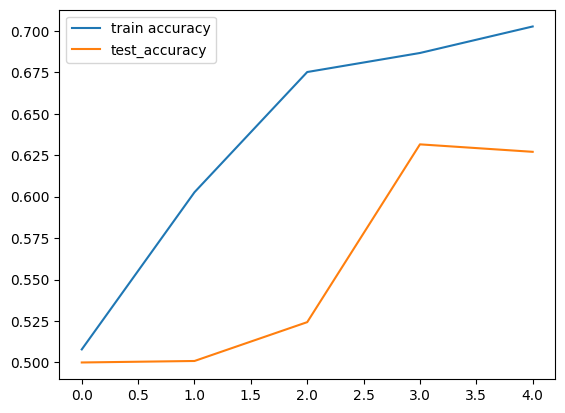

In [9]:
import matplotlib.pyplot as plt
plt.plot(model.history.history['categorical_accuracy'], label = 'train accuracy')
plt.plot(model.history.history['val_categorical_accuracy'],label = 'test_accuracy')
plt.legend()
plt.show()

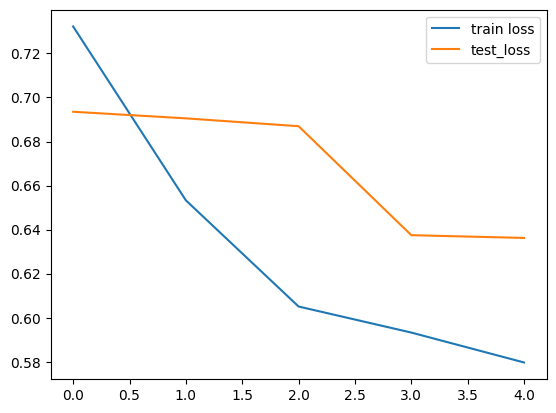

In [10]:
plt.plot(model.history.history['loss'], label = 'train loss')
plt.plot(model.history.history['val_loss'],label = 'test_loss')
plt.legend()
plt.show()

resume training

In [11]:
model.fit(
    train_generator,
    steps_per_epoch=len(train_generator),
    validation_steps=len(val_generator),
    validation_data=val_generator,
    epochs=15,
    class_weight=class_weights,
    # callbacks=[
    #           ModelCheckpoint(filepath='own_model.weights.best.from_scratch.hdf5', verbose=1, save_best_only=True)
    #       ]
)

Epoch 1/15
139/139 [==============================] - 92s 663ms/step - loss: 0.5703 - categorical_accuracy: 0.7109 - val_loss: 0.6669 - val_categorical_accuracy: 0.6351
Epoch 2/15
139/139 [==============================] - 81s 584ms/step - loss: 0.5628 - categorical_accuracy: 0.7175 - val_loss: 0.6547 - val_categorical_accuracy: 0.6090
Epoch 3/15
139/139 [==============================] - 86s 620ms/step - loss: 0.5596 - categorical_accuracy: 0.7222 - val_loss: 0.6436 - val_categorical_accuracy: 0.6261
Epoch 4/15
139/139 [==============================] - 80s 574ms/step - loss: 0.5561 - categorical_accuracy: 0.7247 - val_loss: 0.6209 - val_categorical_accuracy: 0.6973
Epoch 5/15
139/139 [==============================] - 80s 578ms/step - loss: 0.5505 - categorical_accuracy: 0.7267 - val_loss: 0.6028 - val_categorical_accuracy: 0.6955
Epoch 6/15
139/139 [==============================] - 79s 570ms/step - loss: 0.5525 - categorical_accuracy: 0.7238 - val_loss: 0.6089 - val_categorical_acc

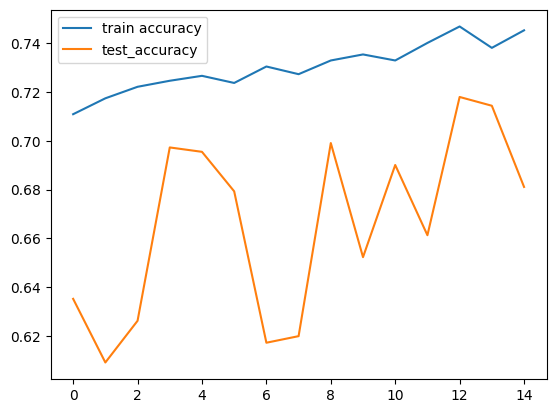

In [12]:
import matplotlib.pyplot as plt
plt.plot(model.history.history['categorical_accuracy'], label = 'train accuracy')
plt.plot(model.history.history['val_categorical_accuracy'],label = 'test_accuracy')
plt.legend()
plt.show()

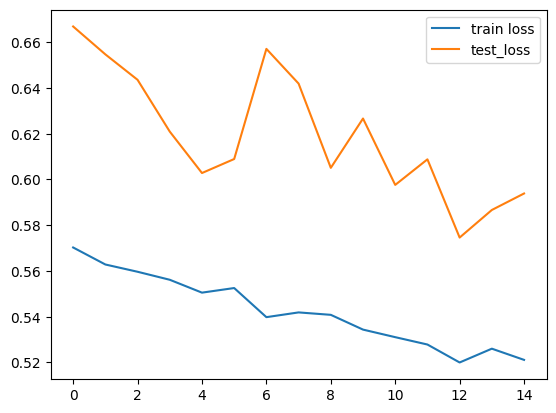

In [13]:
plt.plot(model.history.history['loss'], label = 'train loss')
plt.plot(model.history.history['val_loss'],label = 'test_loss')
plt.legend()
plt.show()

35/35 [==============================] - 16s 430ms/step


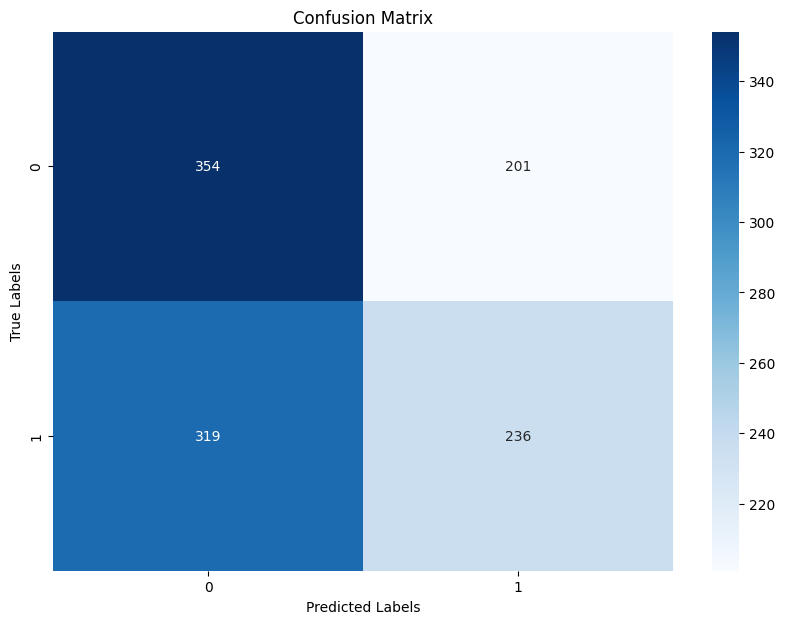

Classification Report:
                  precision    recall  f1-score   support

   Cardiomegaly       0.53      0.64      0.58       555
nonCardiomegaly       0.54      0.43      0.48       555

       accuracy                           0.53      1110
      macro avg       0.53      0.53      0.53      1110
   weighted avg       0.53      0.53      0.53      1110



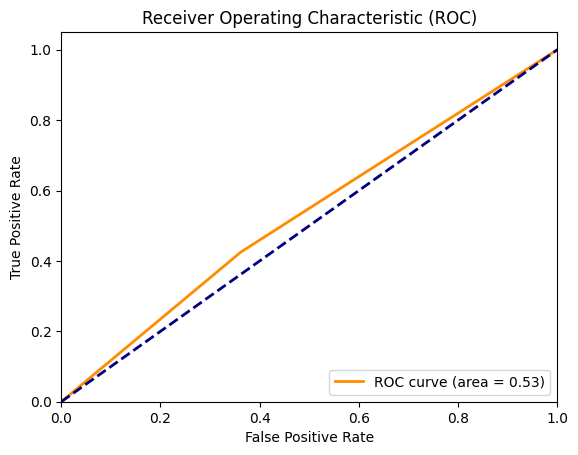

In [31]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Assuming the model and val_generator are already defined
# Get the true labels and predicted probabilities
y_true = val_generator.classes.astype(int)
y_pred_proba = model.predict(val_generator, steps=len(val_generator))
y_pred = (y_pred_proba > 0.5).astype(int)
y_pred = np.argmax(y_pred,axis=1).astype(int)

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Classification Report
report = classification_report(y_true, y_pred, target_names=val_generator.class_indices.keys())
print("Classification Report:\n", report)

# ROC Curve and AUC
fpr, tpr, thresholds = roc_curve(y_true, y_pred)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

In [15]:
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [16]:
from tensorflow.keras.models import load_model
model = load_model('model.h5')
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 224, 224, 16)      208       
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 112, 112, 16)      0         
 g2D)                                                            
                                                                 
 dropout_6 (Dropout)         (None, 112, 112, 16)      0         
                                                                 
 conv2d_8 (Conv2D)           (None, 112, 112, 32)      2080      
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 56, 56, 32)        0         
 g2D)                                                            
                                                                 
 dropout_7 (Dropout)         (None, 56, 56, 32)       

In [17]:
# Import necessary libraries
from PIL import Image
from matplotlib import cm
import sys

# Define function to generate Grad-CAM visualization for given image and CNN model
def grad_cam(model, image, layer_name):

    # Define model that generates both final model predictions as well as output of chosen layer
    grad_model = tf.keras.Model([model.inputs], [model.get_layer(layer_name).output, model.output])

    # Incoming image is singular example so expand dimensions to represent batch of size 1
    image_tensor = np.expand_dims(image, axis=0)

    # Cast image tensor to float32 type
    inputs = tf.cast(image_tensor, tf.float32)

    # Set up gradient tape to monitor intermediate variables and predictions
    with tf.GradientTape() as tape:

        # Extract activations from chosen layer and model's final predictions
        last_conv_layer_output, preds = grad_model(inputs)

        # Identify predicted class from final predictions
        pred_class = tf.argmax(preds[0])

        # Get output of predicted class from final layer
        class_channel = preds[:, pred_class]

    # Compute gradient of output with respect to chosen layer's output
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # Reduce 2D gradients to 1D by averaging across height and width dimensions
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Multiply 2D output map of chosen layer by 1D pooled gradients
    heatmap = last_conv_layer_output[0] @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Normalize heatmap to be between 0 and 1 for better visualization
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)

    # Return Grad-CAM heatmap
    return heatmap.numpy()

(224, 224, 3)


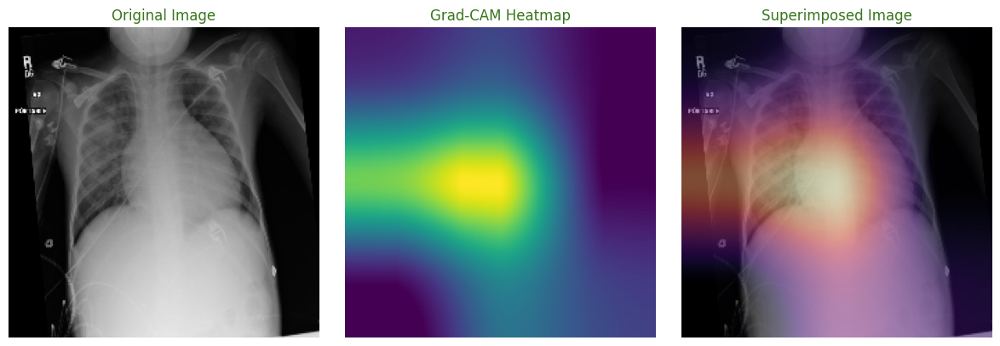

(224, 224, 3)


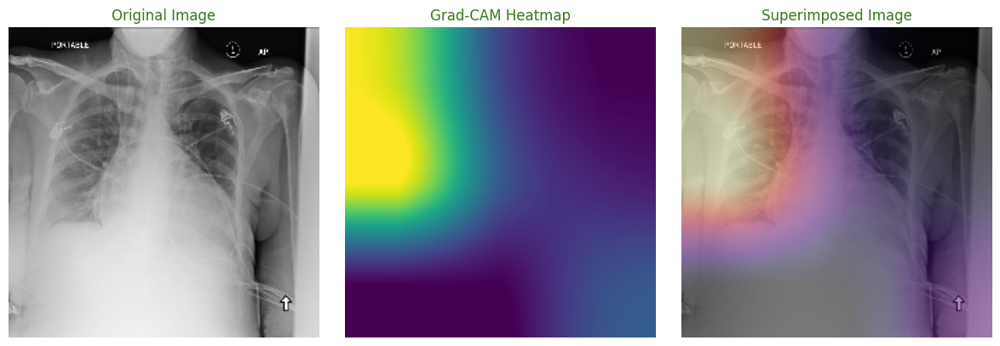

(224, 224, 3)


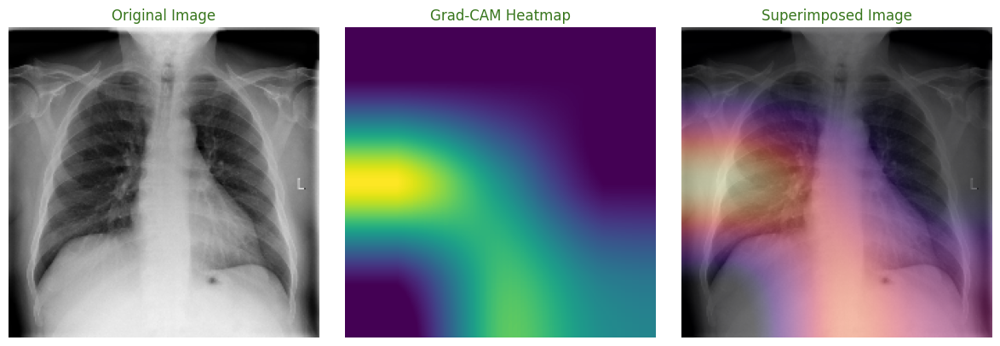

(224, 224, 3)


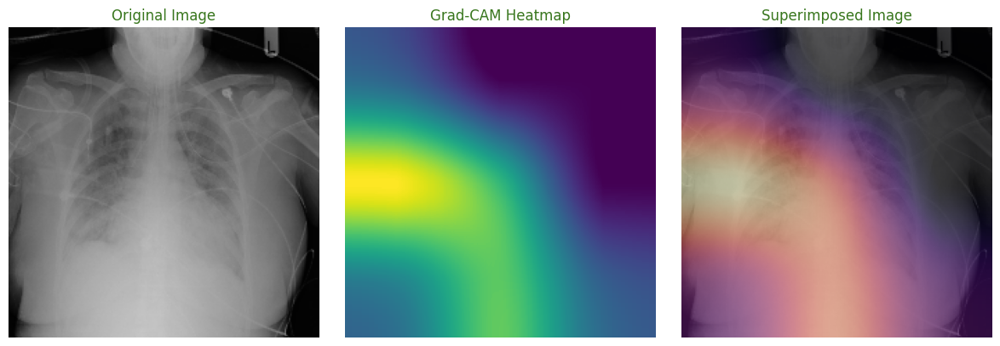

(224, 224, 3)


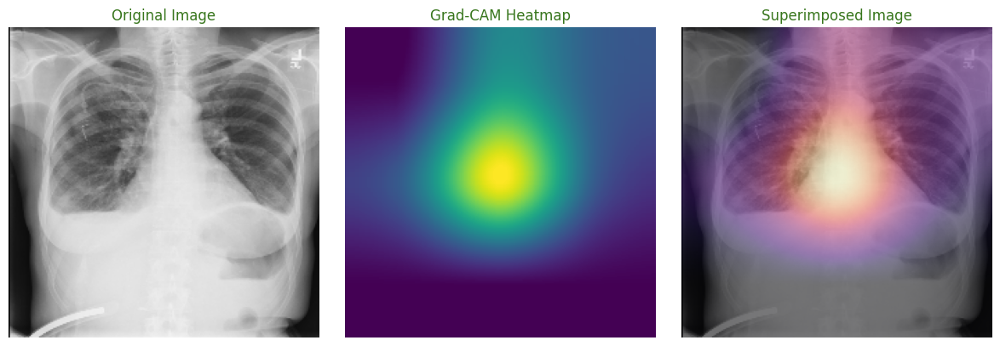

(224, 224, 3)


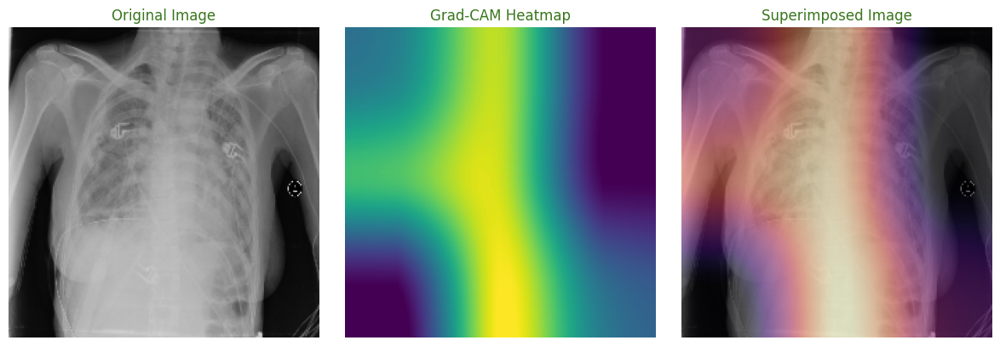

(224, 224, 3)


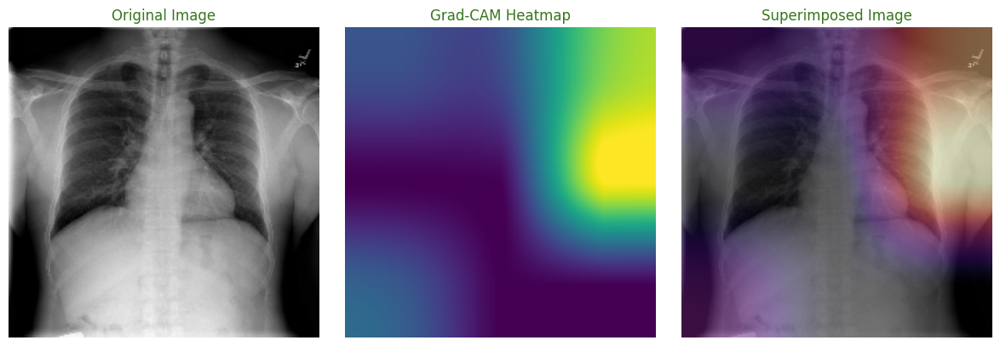

(224, 224, 3)


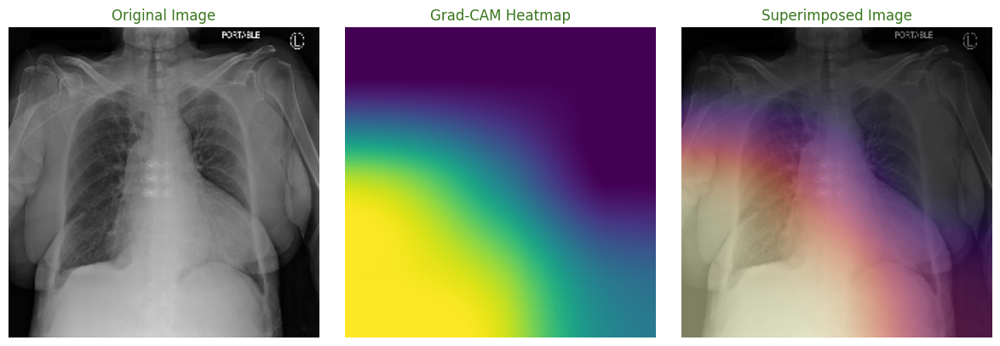

(224, 224, 3)


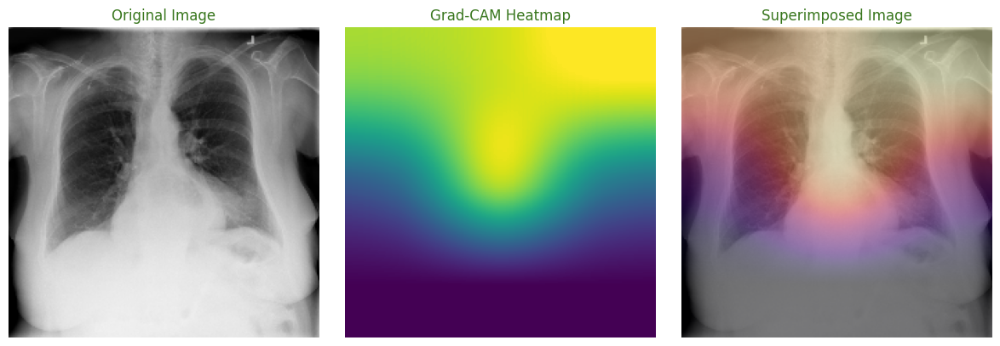

(224, 224, 3)


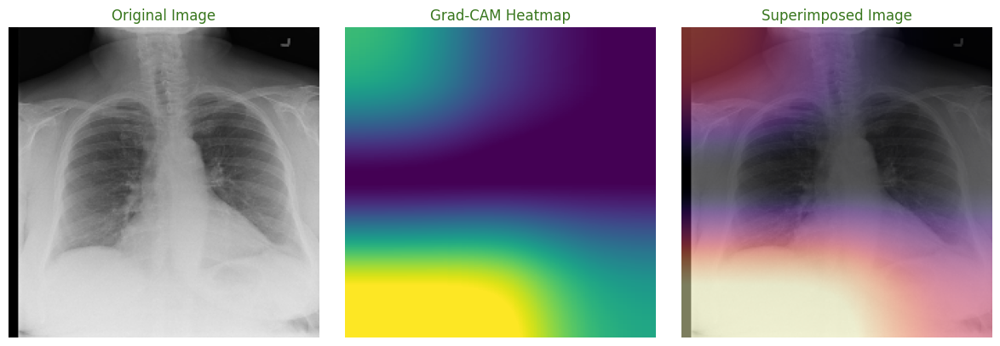

(224, 224, 3)


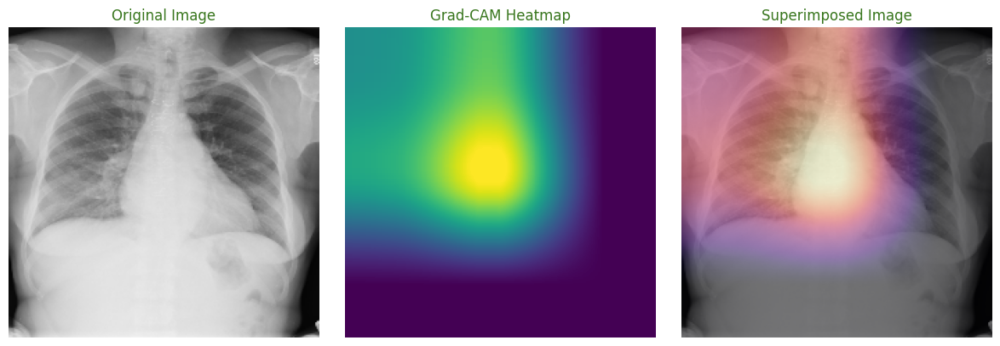

(224, 224, 3)


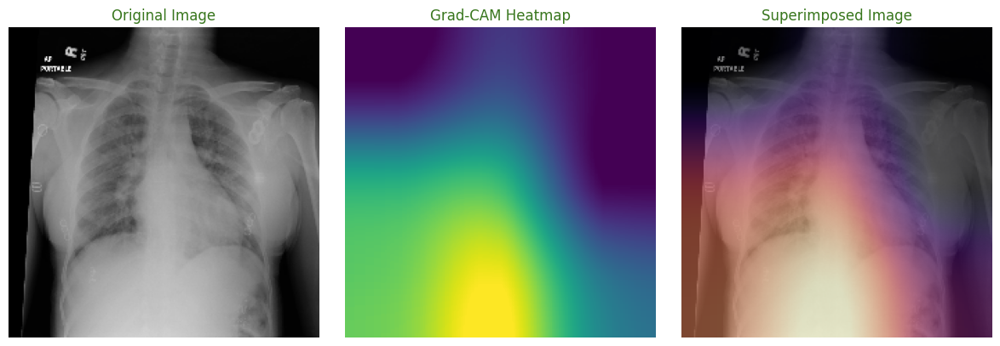

In [27]:
import glob
import cv2
import numpy as np
import tensorflow as tf
# Set number of images to display and generate random indices
num_images = 12
test_images = [i for i in glob.glob("/content/content/dataset/Cardiomegaly/*.png")]
image_indices = np.random.choice(len(test_images), size=num_images, replace=False)

# Set layer name based on best performing CNN model for Grad-CAM visualization
layer_name = 'conv2d_13'

# Loop over random indices to generate Grad-CAM visualizations for multiple test images
for image_index in image_indices:

    # Choose test image and visualize using Grad-CAM
    image = cv2.imread(test_images[image_index])
    image = cv2.resize(image,(224,224))/255.0
    # cv2.imwrite('original.png', 255*image)
    print(np.shape(image))
    grad_cam_image = grad_cam(model, image, layer_name)

    # Enhance heatmap image for better visualization
    grad_cam_image = np.maximum(grad_cam_image, 0)
    grad_cam_image = np.minimum(grad_cam_image, 1)
    heatmap_colored = np.uint8(255 * grad_cam_image)
    # heatmap_colored = cm.jet(grad_cam_image)[:, :, :3]
    # heatmap_colored = np.uint8(255 * heatmap_colored)

    # Resize heatmap to original image size
    heatmap_resized = np.array(Image.fromarray(heatmap_colored).resize((image.shape[1], image.shape[0])))

    # Convert image and heatmap to 0-255 scale
    if image.max() <= 1:
        image = (image * 255).astype('uint8')
    if heatmap_resized.max() <= 1:
        heatmap_resized = (heatmap_resized * 255).astype('uint8')

    # Superimpose heatmap on original image, with more weight on original image
    # superimposed_image = heatmap_resized * 0.4 + image * 0.6
    # superimposed_image = np.clip(superimposed_image, 0, 255).astype('uint8')

    # Temporarily redirect standard output to null to suppress verbose output
    original_stdout = sys.stdout
    sys.stdout = open(os.devnull, 'w')

    # # Predict class of image using final hybrid model
    # test_feature = best_cnn_model.predict(np.expand_dims(image, axis=0))
    # predicted_class = final_hybrid_model.predict(test_feature)
    # predicted_class_name = class_names[np.argmax(predicted_class)]
    # actual_class_name = class_names[np.argmax(test_labels_xgb[image_index])]

    # Restore standard output to original state
    sys.stdout = original_stdout

    # Determine if prediction is correct
    # is_correct = (actual_class_name == predicted_class_name)

    # Assign title color based on prediction correctness
    title_color = '#38761D'

    # Set up plot for original, heatmap and superimposed images
    plt.figure(figsize=(12, 4))

    # Plot original image
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title(f'Original Image', color=title_color)
    plt.axis('off')

    # Plot heatmap image
    plt.subplot(1, 3, 2)
    plt.imshow(heatmap_resized)
    plt.title('Grad-CAM Heatmap', color=title_color)
    plt.axis('off')

    # Plot superimposed image
    plt.subplot(1, 3, 3)
    # plt.imshow(superimposed_image.astype(np.uint8))
    plt.imshow(image, cmap='gray')
    plt.imshow(heatmap_resized, cmap='magma', alpha=0.5)
    plt.title(f'Superimposed Image', color=title_color)
    # Convert heatmap to a colored heatmap using a colormap
    heatmap_colored = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_MAGMA)

    # Overlay heatmap on the original image
    overlay = cv2.addWeighted(image, 0.5, heatmap_colored, 0.5, 0)

    # Save the resulting image
    cv2.imwrite('merged_image.jpg', overlay)
    plt.axis('off')

    # Adjust subplot parameters to give specified padding
    plt.tight_layout()

    # Show plot
    plt.show()

(224, 224, 3)


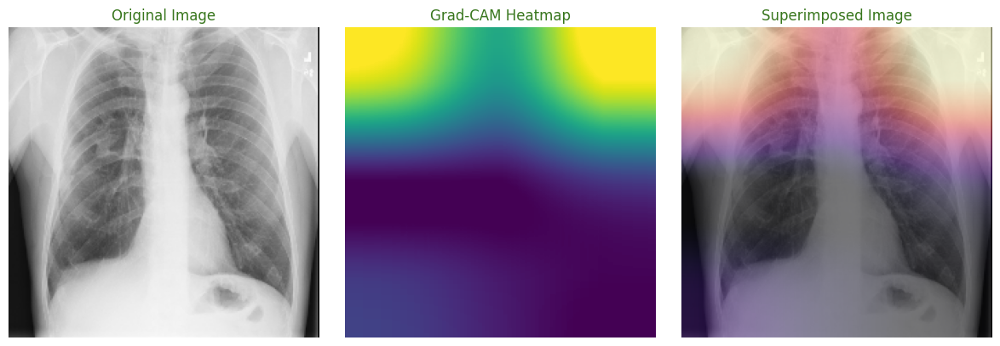

(224, 224, 3)


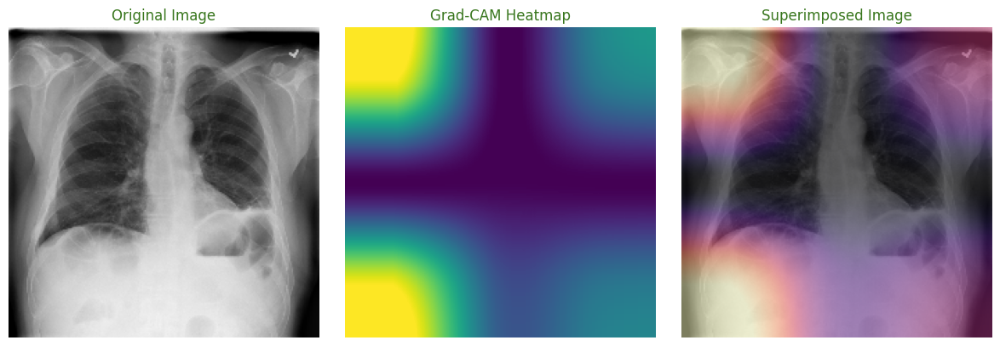

(224, 224, 3)


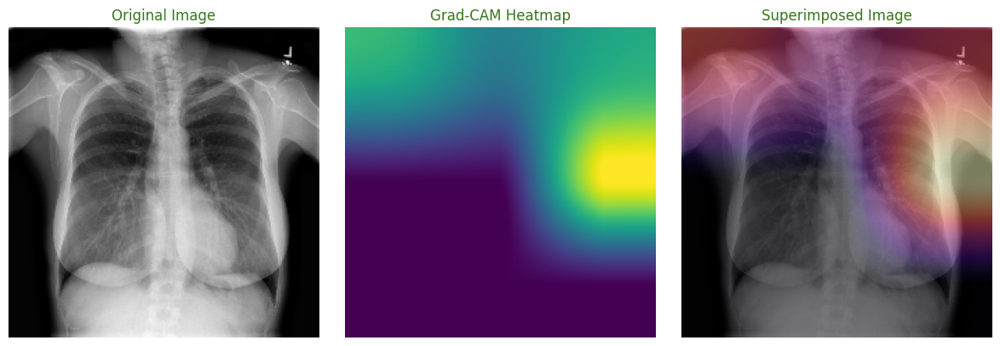

(224, 224, 3)


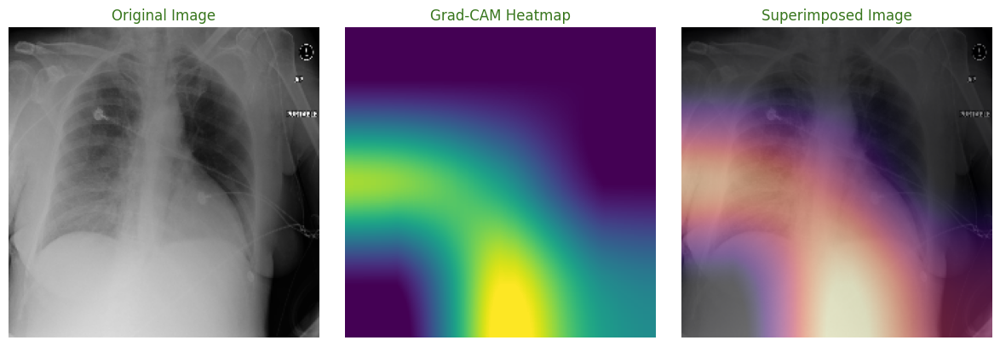

(224, 224, 3)


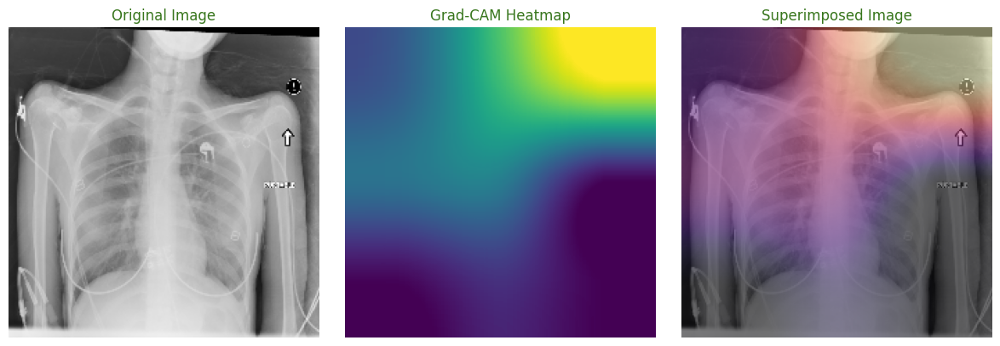

(224, 224, 3)


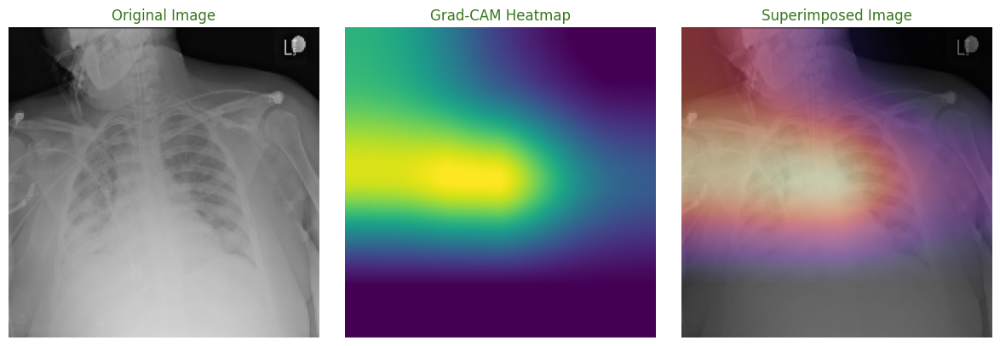

(224, 224, 3)


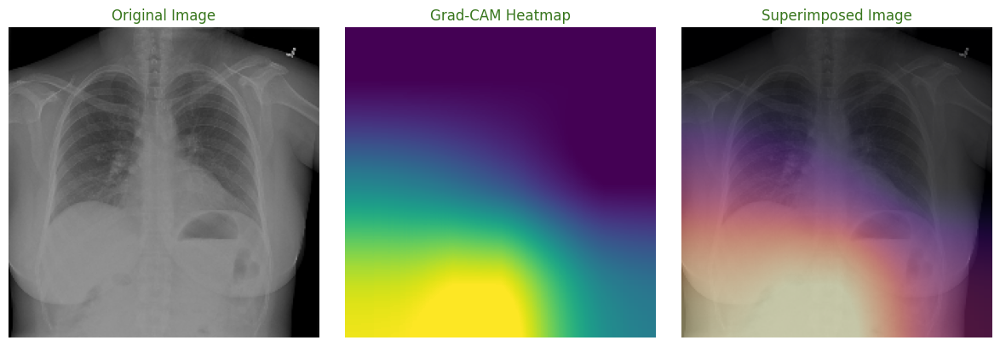

(224, 224, 3)


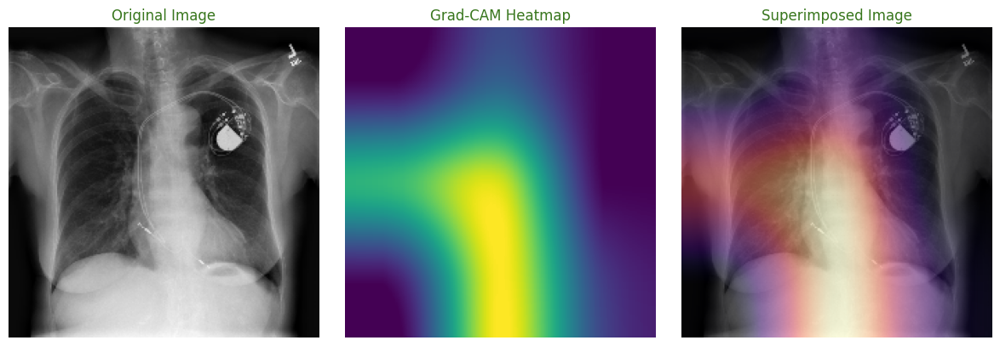

(224, 224, 3)


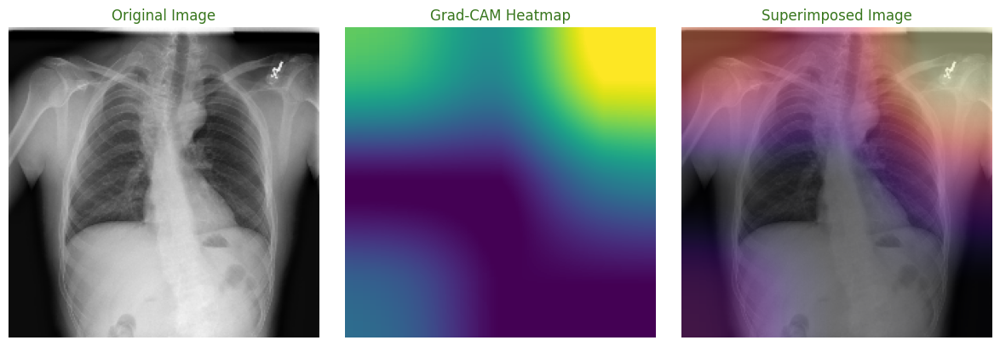

(224, 224, 3)


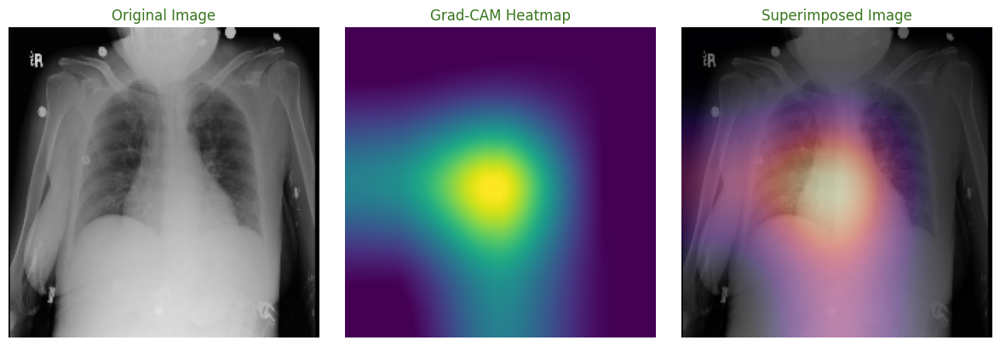

(224, 224, 3)


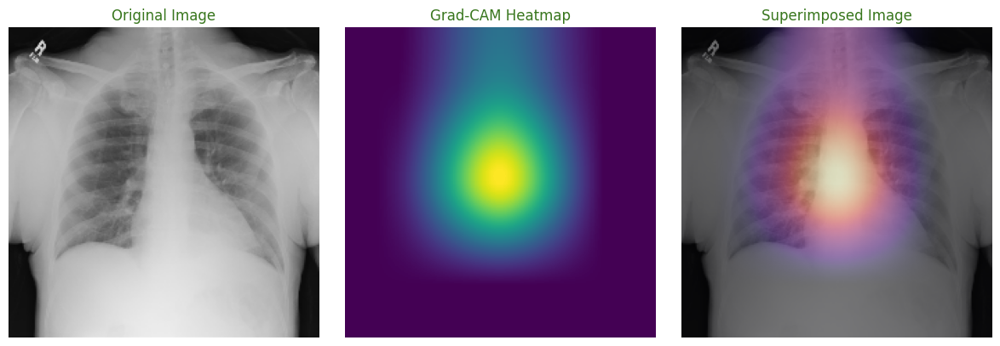

(224, 224, 3)


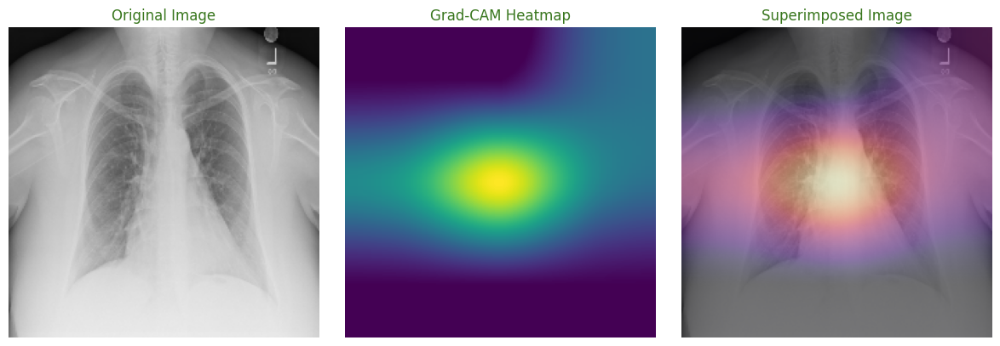

In [28]:
import glob
import cv2
import numpy as np
import tensorflow as tf
# Set number of images to display and generate random indices
num_images = 12
test_images = [i for i in glob.glob("/content/content/dataset/nonCardiomegaly/*.png")]
image_indices = np.random.choice(len(test_images), size=num_images, replace=False)

# Set layer name based on best performing CNN model for Grad-CAM visualization
layer_name = 'conv2d_13'

# Loop over random indices to generate Grad-CAM visualizations for multiple test images
for image_index in image_indices:

    # Choose test image and visualize using Grad-CAM
    image = cv2.imread(test_images[image_index])
    image = cv2.resize(image,(224,224))/255.0
    # cv2.imwrite('original.png', 255*image)
    print(np.shape(image))
    grad_cam_image = grad_cam(model, image, layer_name)

    # Enhance heatmap image for better visualization
    grad_cam_image = np.maximum(grad_cam_image, 0)
    grad_cam_image = np.minimum(grad_cam_image, 1)
    heatmap_colored = np.uint8(255 * grad_cam_image)
    # heatmap_colored = cm.jet(grad_cam_image)[:, :, :3]
    # heatmap_colored = np.uint8(255 * heatmap_colored)

    # Resize heatmap to original image size
    heatmap_resized = np.array(Image.fromarray(heatmap_colored).resize((image.shape[1], image.shape[0])))

    # Convert image and heatmap to 0-255 scale
    if image.max() <= 1:
        image = (image * 255).astype('uint8')
    if heatmap_resized.max() <= 1:
        heatmap_resized = (heatmap_resized * 255).astype('uint8')

    # Superimpose heatmap on original image, with more weight on original image
    # superimposed_image = heatmap_resized * 0.4 + image * 0.6
    # superimposed_image = np.clip(superimposed_image, 0, 255).astype('uint8')

    # Temporarily redirect standard output to null to suppress verbose output
    original_stdout = sys.stdout
    sys.stdout = open(os.devnull, 'w')

    # # Predict class of image using final hybrid model
    # test_feature = best_cnn_model.predict(np.expand_dims(image, axis=0))
    # predicted_class = final_hybrid_model.predict(test_feature)
    # predicted_class_name = class_names[np.argmax(predicted_class)]
    # actual_class_name = class_names[np.argmax(test_labels_xgb[image_index])]

    # Restore standard output to original state
    sys.stdout = original_stdout

    # Determine if prediction is correct
    # is_correct = (actual_class_name == predicted_class_name)

    # Assign title color based on prediction correctness
    title_color = '#38761D'

    # Set up plot for original, heatmap and superimposed images
    plt.figure(figsize=(12, 4))

    # Plot original image
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title(f'Original Image', color=title_color)
    plt.axis('off')

    # Plot heatmap image
    plt.subplot(1, 3, 2)
    plt.imshow(heatmap_resized)
    plt.title('Grad-CAM Heatmap', color=title_color)
    plt.axis('off')

    # Plot superimposed image
    plt.subplot(1, 3, 3)
    # plt.imshow(superimposed_image.astype(np.uint8))
    plt.imshow(image, cmap='gray')
    plt.imshow(heatmap_resized, cmap='magma', alpha=0.5)
    plt.title(f'Superimposed Image', color=title_color)
    # Convert heatmap to a colored heatmap using a colormap
    heatmap_colored = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_MAGMA)

    # Overlay heatmap on the original image
    overlay = cv2.addWeighted(image, 0.5, heatmap_colored, 0.5, 0)

    # Save the resulting image
    cv2.imwrite('merged_image.jpg', overlay)
    plt.axis('off')

    # Adjust subplot parameters to give specified padding
    plt.tight_layout()

    # Show plot
    plt.show()